In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style

%matplotlib inline
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.tools as tls
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)
import squarify

# import required libraries for clustering
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

In [33]:
# read data
data = pd.read_csv("Absenteeism_at_work.csv",index_col="ID")
data.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,...,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours,Unnamed: 21
ID,,,,,,,,,,,,,,,,,,,,,
1,22,7,2,1,235,11,14,37,"239,554",97,...,3,1,0,0,1,88,172,29,8,NaN
1,23,8,5,1,235,11,14,37,"205,917",92,...,3,1,0,0,1,88,172,29,4,NaN
1,26,12,4,4,235,11,14,37,"261,306",97,...,3,1,0,0,1,88,172,29,8,NaN
1,7,4,6,3,235,11,14,37,"326,452",96,...,3,1,0,0,1,88,172,29,3,NaN
1,13,6,6,3,235,11,14,37,"377,550",94,...,3,1,0,0,1,88,172,29,16,NaN


In [4]:
# data types
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 740 entries, 1 to 36
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Reason for absence               740 non-null    int64  
 1   Month of absence                 740 non-null    int64  
 2   Day of the week                  740 non-null    int64  
 3   Seasons                          740 non-null    int64  
 4   Transportation expense           740 non-null    int64  
 5   Distance from Residence to Work  740 non-null    int64  
 6   Service time                     740 non-null    int64  
 7   Age                              740 non-null    int64  
 8   Work load Average/day            740 non-null    object 
 9   Hit target                       740 non-null    int64  
 10  Disciplinary failure             740 non-null    int64  
 11  Education                        740 non-null    int64  
 12  Son                    

In [5]:
# min and max values
data.describe()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours,Unnamed: 21
count,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,0.0
mean,19.216216,6.324324,3.914865,2.544595,221.329730,29.631081,12.554054,36.450000,94.587838,0.054054,1.291892,1.018919,0.567568,0.072973,0.745946,79.035135,172.114865,26.677027,6.924324,NaN
std,8.433406,3.436287,1.421675,1.111831,66.952223,14.836788,4.384873,6.478772,3.779313,0.226277,0.673238,1.098489,0.495749,0.260268,1.318258,12.883211,6.034995,4.285452,13.330998,NaN
min,0.000000,0.000000,2.000000,1.000000,118.000000,5.000000,1.000000,27.000000,81.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,56.000000,163.000000,19.000000,0.000000,NaN
25%,13.000000,3.000000,3.000000,2.000000,179.000000,16.000000,9.000000,31.000000,93.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,69.000000,169.000000,24.000000,2.000000,NaN
50%,23.000000,6.000000,4.000000,3.000000,225.000000,26.000000,13.000000,37.000000,95.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,83.000000,170.000000,25.000000,3.000000,NaN
75%,26.000000,9.000000,5.000000,4.000000,260.000000,50.000000,16.000000,40.000000,97.000000,0.000000,1.000000,2.000000,1.000000,0.000000,1.000000,89.000000,172.000000,31.000000,8.000000,NaN
max,28.000000,12.000000,6.000000,4.000000,388.000000,52.000000,29.000000,58.000000,100.000000,1.000000,4.000000,4.000000,1.000000,1.000000,8.000000,108.000000,196.000000,38.000000,120.000000,NaN


In [34]:
#Count missing variable
data.isnull().sum().sort_values(ascending=False)

Unnamed: 21                        740
Education                            0
Absenteeism time in hours            0
Body mass index                      0
Height                               0
Weight                               0
Pet                                  0
Social smoker                        0
Social drinker                       0
Son                                  0
Reason for absence                   0
Month of absence                     0
Hit target                           0
Work load Average/day                0
Age                                  0
Service time                         0
Distance from Residence to Work      0
Transportation expense               0
Seasons                              0
Day of the week                      0
Disciplinary failure                 0
dtype: int64

In [7]:
# number of unique values in categorical atts
data[categorical_atts].nunique()

Reason for absence      28
Month of absence        13
Day of the week          5
Seasons                  4
Disciplinary failure     2
Education                4
Social drinker           2
Social smoker            2
Pet                      6
Son                      5
dtype: int64

C:\Python310\lib\site-packages\seaborn\categorical.py:3750: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


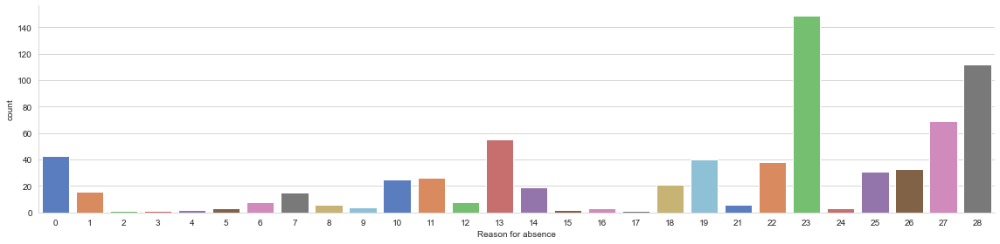

In [8]:
# plot distribution of "reason for absence" column
sns.set_style("whitegrid")
sns.catplot(data=data, x='Reason for absence', kind= 'count',size=4, aspect=4, palette='muted')

In [13]:
# plot distribution of numerical attributes
num_df = data[numerical_atts]


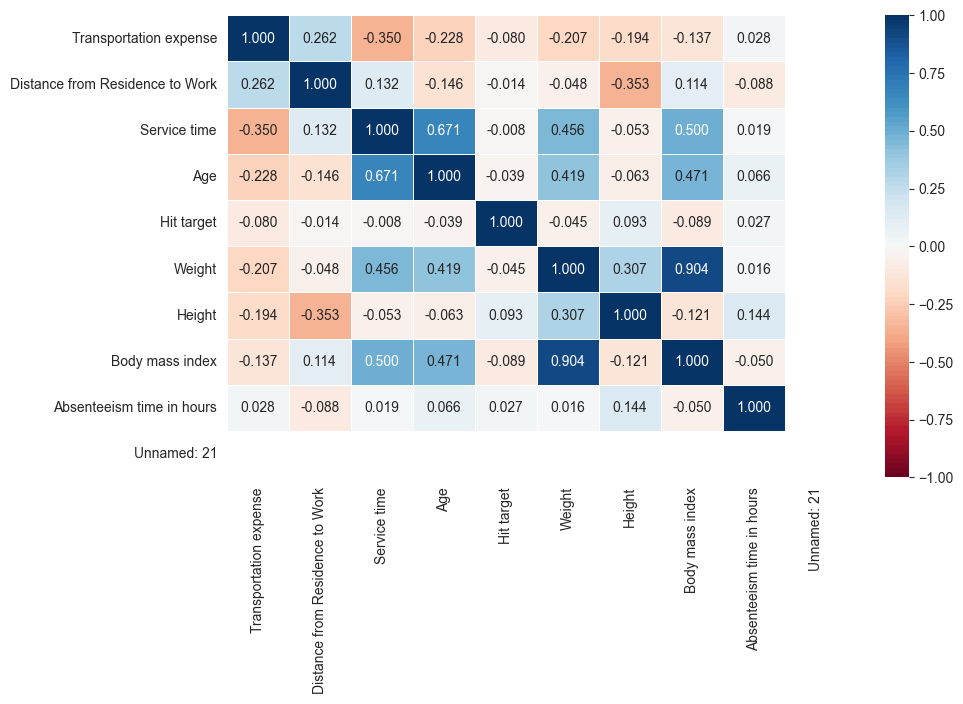

In [11]:
# correlation matrix
num_corr = num_df.corr()
plt.figure(figsize=(10,6))
sns.heatmap(num_corr, annot=True, fmt=".3f",vmin=-1, vmax=1, linewidths=.5, cmap = sns.color_palette("RdBu", 100))
plt.yticks(rotation=0)
plt.show()

C:\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Education', ylabel='count'>

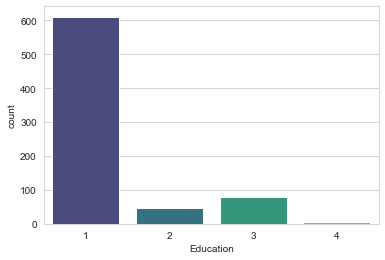

In [35]:
sns.countplot(data['Education'],palette='viridis')

C:\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Seasons', ylabel='count'>

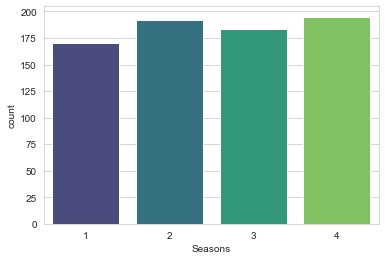

In [36]:
sns.countplot(data['Seasons'],palette='viridis')


Text(0.5, 1.0, 'Month of absence vs Seasons')

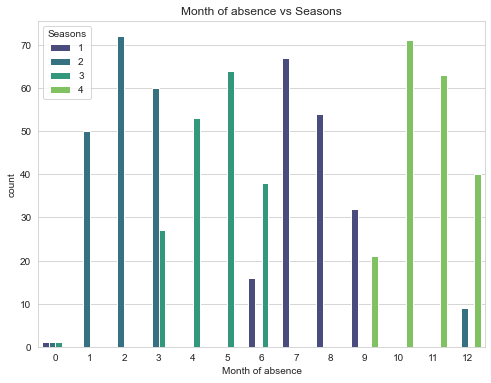

In [37]:
plt.figure(figsize=(8,6))
sns.countplot(x='Month of absence',hue='Seasons',data=data,palette='viridis')
plt.title("Month of absence vs Seasons")

C:\Python310\lib\site-packages\seaborn\_core.py:1057: FutureWarning:

reindexing with a non-unique Index is deprecated and will raise in a future version.



ValueError: cannot reindex on an axis with duplicate labels

<Figure size 720x480 with 0 Axes>

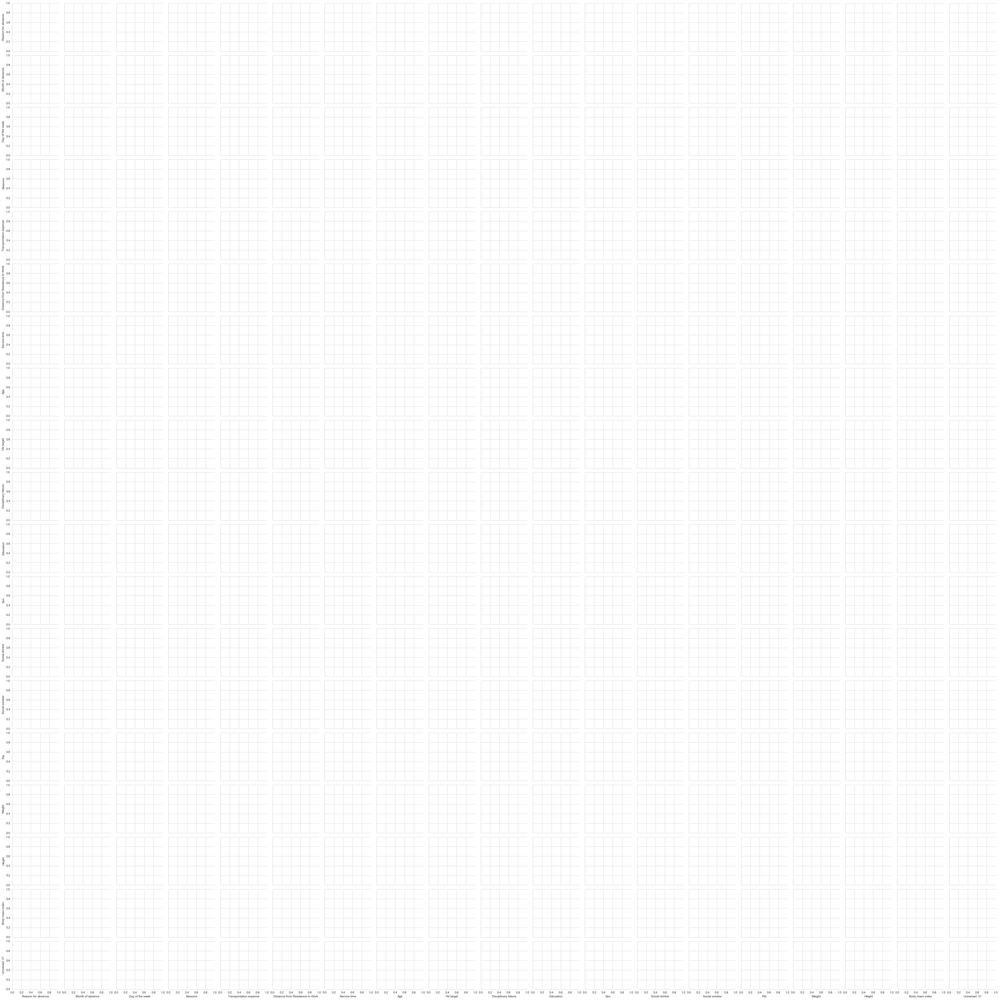

In [38]:
plt.figure(dpi = 120)
sns.pairplot(data,hue = 'Absenteeism time in hours',palette = 'plasma')
plt.legend(['Non Diabetic','Diabetic'])
plt.show()

Joint plot of Month of Absence with Other Variables ==> 

Correlation between Month of absence and Reason for absence ==>  -0.08385777368146707


C:\Python310\lib\site-packages\seaborn\_core.py:1057: FutureWarning:

reindexing with a non-unique Index is deprecated and will raise in a future version.



ValueError: cannot reindex on an axis with duplicate labels

<Figure size 500x400 with 0 Axes>

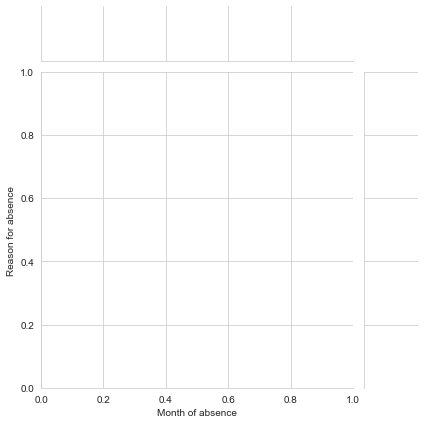

In [39]:
plt.figure(dpi = 100, figsize = (5,4))
print("Joint plot of Month of Absence with Other Variables ==> \n")
for i in  data.columns:
    if i != 'Glucose' and i != 'Outcome':
        print(f"Correlation between Month of absence and {i} ==> ",data.corr().loc['Month of absence'][i])
        sns.jointplot(x='Month of absence',y=i,data=data,kind = 'reg',color = 'purple')
        plt.show()

array([[<AxesSubplot:title={'center':'Reason for absence'}>,
        <AxesSubplot:title={'center':'Month of absence'}>,
        <AxesSubplot:title={'center':'Day of the week'}>,
        <AxesSubplot:title={'center':'Seasons'}>],
       [<AxesSubplot:title={'center':'Transportation expense'}>,
        <AxesSubplot:title={'center':'Distance from Residence to Work'}>,
        <AxesSubplot:title={'center':'Service time'}>,
        <AxesSubplot:title={'center':'Age'}>],
       [<AxesSubplot:title={'center':'Hit target'}>,
        <AxesSubplot:title={'center':'Disciplinary failure'}>,
        <AxesSubplot:title={'center':'Education'}>,
        <AxesSubplot:title={'center':'Son'}>],
       [<AxesSubplot:title={'center':'Social drinker'}>,
        <AxesSubplot:title={'center':'Social smoker'}>,
        <AxesSubplot:title={'center':'Pet'}>,
        <AxesSubplot:title={'center':'Weight'}>],
       [<AxesSubplot:title={'center':'Height'}>,
        <AxesSubplot:title={'center':'Body mass index'}>,

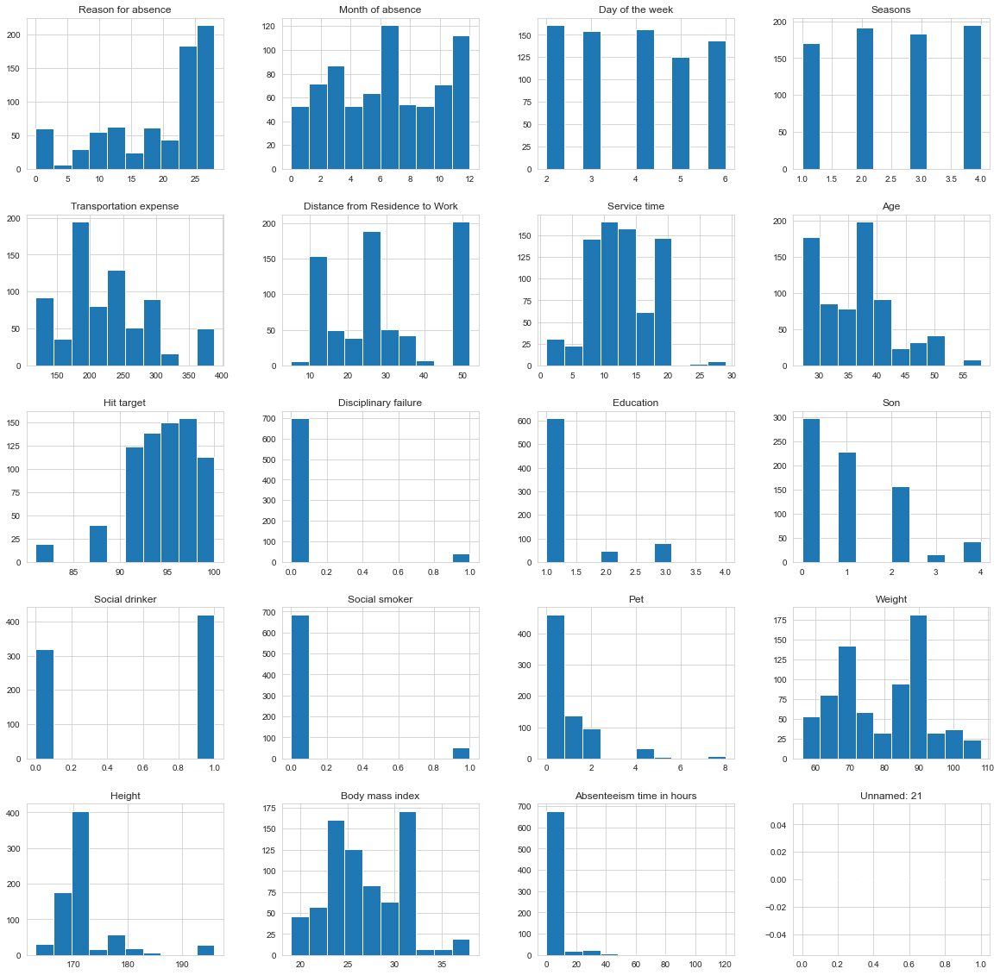

In [41]:
# see how the data is distributed.
data.hist(figsize = (20,20))

In [42]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
vals = data['Social drinker'].value_counts().tolist()
labels = [0,1]

df = [go.Bar(
            x=labels,
            y=vals,
    marker=dict(
    color="#FE9A2E")
    )]

layout = go.Layout(
    title="Count by Social drinker",
)

fig = go.Figure(data=df, layout=layout)



iplot(fig, filename='basic-bar')

In [44]:
import pandas_profiling as pp

pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h1>Variables</h1>

In [45]:
def customized_scatterplot(y, x):
        ## Sizing the plot. 
    style.use('fivethirtyeight')
    plt.subplots(figsize = (12,8))
    ## Plotting target variable with predictor variable(OverallQual)
    sns.scatterplot(y = y, x = x);

In [46]:
data.columns

Index(['Reason for absence', 'Month of absence', 'Day of the week', 'Seasons',
       'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target',
       'Disciplinary failure', 'Education', 'Son', 'Social drinker',
       'Social smoker', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours', 'Unnamed: 21'],
      dtype='object')

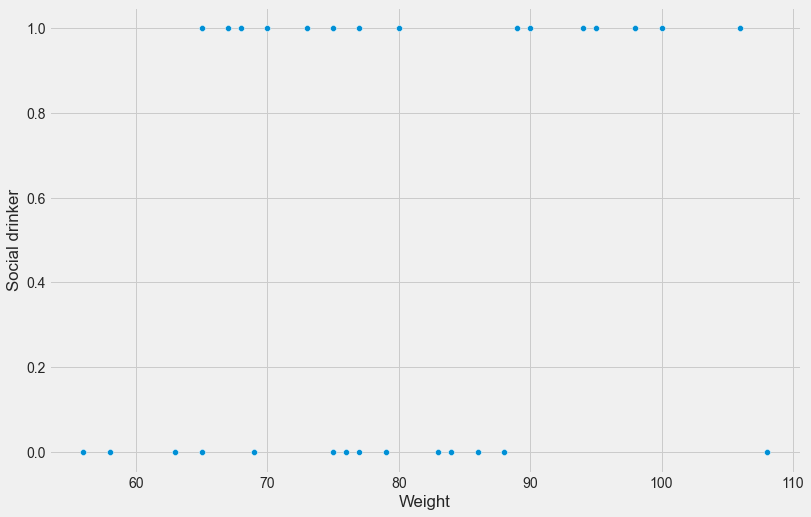

In [47]:
customized_scatterplot(data['Social drinker'], data['Weight'])


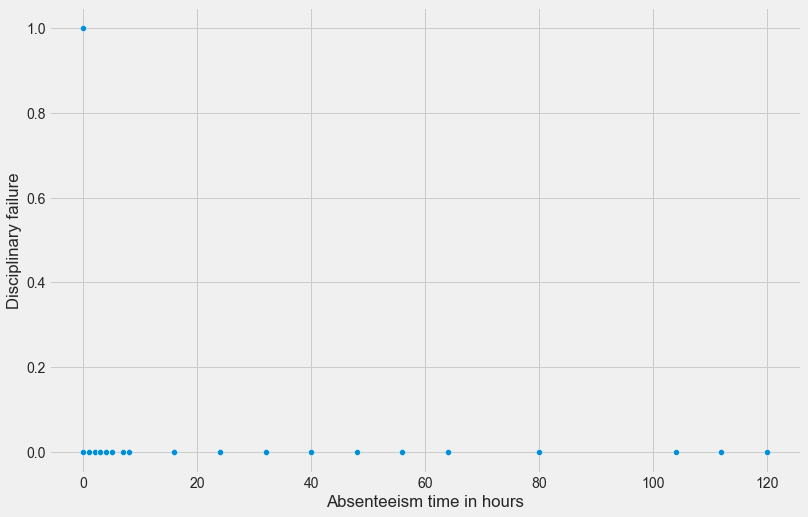

In [48]:
customized_scatterplot(data['Disciplinary failure'], data['Absenteeism time in hours'])


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'Reason for absence'),
  Text(1, 0, 'Month of absence'),
  Text(2, 0, 'Day of the week'),
  Text(3, 0, 'Seasons'),
  Text(4, 0, 'Transportation expense'),
  Text(5, 0, 'Distance from Residence to Work'),
  Text(6, 0, 'Service time'),
  Text(7, 0, 'Age'),
  Text(8, 0, 'Hit target'),
  Text(9, 0, 'Disciplinary failure'),
  Text(10, 0, 'Education'),
  Text(11, 0, 'Son'),
  Text(12, 0, 'Social drinker'),
  Text(13, 0, 'Social smoker'),
  Text(14, 0, 'Pet'),
  Text(15, 0, 'Weight'),
  Text(16, 0, 'Height'),
  Text(17, 0, 'Body mass index'),
  Text(18, 0, 'Absenteeism time in hours'),
  Text(19, 0, 'Unnamed: 21')])

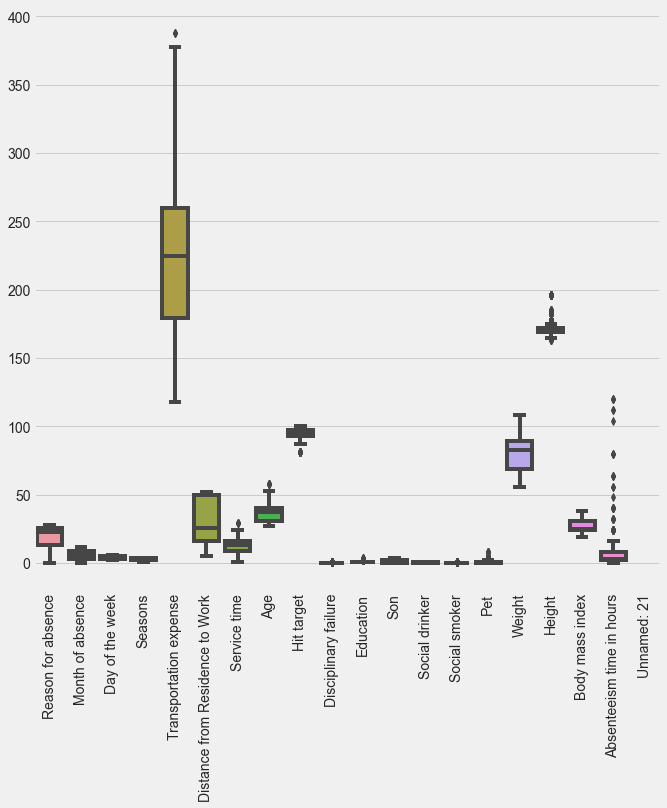

In [49]:
#check outliers
plt.figure(figsize=(10,10))
sns.boxplot(data=data)
plt.xticks(rotation=90)

In [54]:
#Drop outliers according to z-score
from scipy import stats
z = np.abs(stats.zscore(data))
print(z)

threshold = 3
print(np.where(z > 3))

data_o = data[(z < 3).all(axis=1)]

TypeError: unsupported operand type(s) for /: 'str' and 'int'

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'Reason for absence'),
  Text(1, 0, 'Month of absence'),
  Text(2, 0, 'Day of the week'),
  Text(3, 0, 'Seasons'),
  Text(4, 0, 'Transportation expense'),
  Text(5, 0, 'Distance from Residence to Work'),
  Text(6, 0, 'Service time'),
  Text(7, 0, 'Age'),
  Text(8, 0, 'Hit target'),
  Text(9, 0, 'Disciplinary failure'),
  Text(10, 0, 'Education'),
  Text(11, 0, 'Son'),
  Text(12, 0, 'Social drinker'),
  Text(13, 0, 'Social smoker'),
  Text(14, 0, 'Pet'),
  Text(15, 0, 'Weight'),
  Text(16, 0, 'Height'),
  Text(17, 0, 'Body mass index'),
  Text(18, 0, 'Absenteeism time in hours'),
  Text(19, 0, 'Unnamed: 21')])

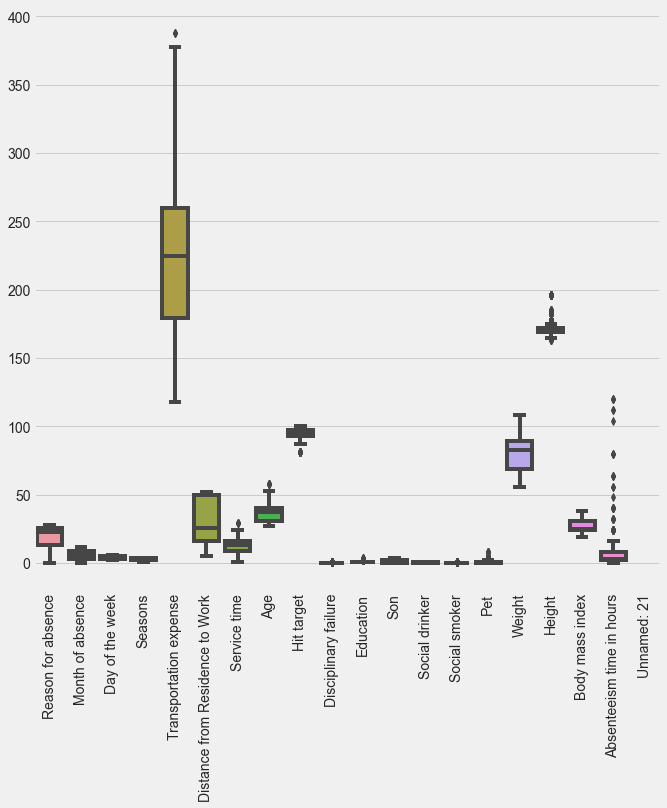

In [56]:
plt.figure(figsize=(10,10))
sns.boxplot(data=data)
plt.xticks(rotation=90)

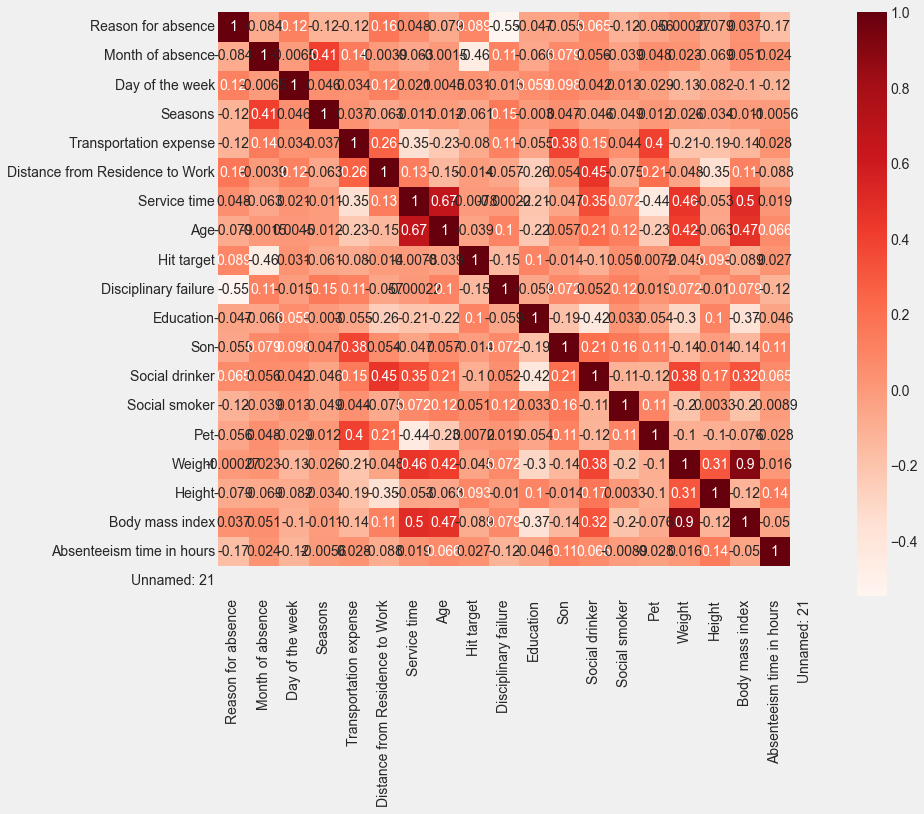

In [58]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [59]:
#Correlation with output variable
cor_target = abs(cor["Absenteeism time in hours"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.5]
relevant_features

Absenteeism time in hours    1.0
Name: Absenteeism time in hours, dtype: float64

<h1>Model</h1>

In [62]:
#KMeans Clustering
#Defining WCSS Elbow point
from sklearn.cluster import KMeans

wcss=[]
for i in range (1,30):
    kmeans=KMeans(i)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
wcss

ValueError: could not convert string to float: '239,554'